# PROCESADO DE IMÁGENES


## Felipe Basurto Barrio - 29/12/2020

##### 1 - Carga de imágenes

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, io, filters, util
from skimage.color import rgb2gray, gray2rgb
import matplotlib.pyplot as plt
import os
from skimage.io import imshow, imread
from skimage.morphology import erosion, dilation
from skimage.morphology import disk
from skimage.morphology import opening, closing
from skimage.measure import label, regionprops, regionprops_table
from PIL import Image
import random
import cv2
from skimage.filters import rank
from skimage import feature


ModuleNotFoundError: No module named 'numpy'

Text(0.5, 1.0, 'Imagen 4')

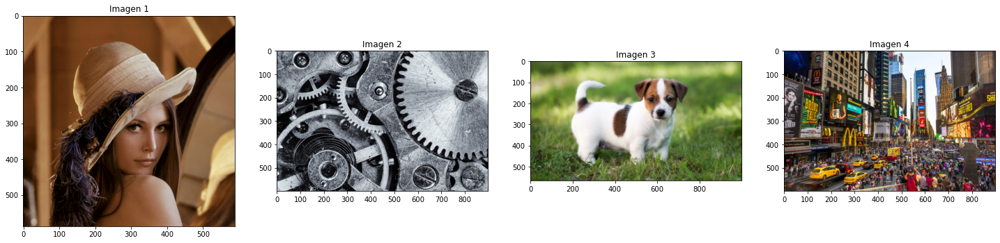

In [ ]:
# --------------------------------- #
# CARGAMOS Y MOSTRAMOS LAS IMÁGENES #
# --------------------------------- #

imagen1 = imread("images"+os.sep+"1.jpg")
imagen2 = imread("images"+os.sep+"2.jpg")
imagen3 = imread("images"+os.sep+"3.jpg")
imagen4 = imread("images"+os.sep+"4.jpg")

###########################################################################################

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex=False, sharey=False,figsize=(25, 10))

ax1.imshow(imagen1,cmap='gray')
ax1.set_title('Imagen 1')

ax2.imshow(imagen2,cmap='gray')
ax2.set_title('Imagen 2')

ax3.imshow(imagen3,cmap='gray')
ax3.set_title('Imagen 3')

ax4.imshow(imagen4,cmap='gray')
ax4.set_title('Imagen 4')


#### ##################################################################################################################

#                                 --- FILTRADO DE IMÁGENES ---

##### 2.1 - Añadiendo ruido de sal y pimienta a la imagen

###### WARNING: SI NO ESTÁ INSTALADO OPENCV, PUEDE DAR ERRORES

In [3]:
def sp_noise(image,prob):
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

Text(0.5, 1.0, 'Imagen 4')

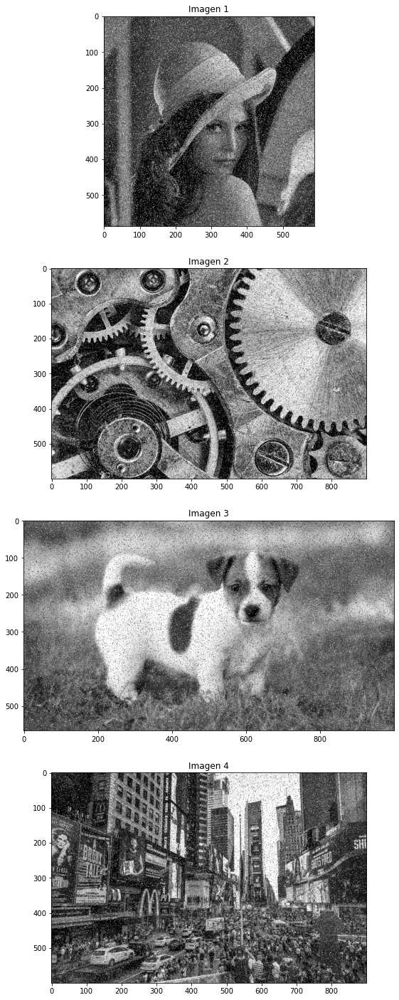

In [ ]:
imagen_sp_rgb1 = sp_noise(imagen1,0.08)
imagen_sp1 = rgb2gray(imagen_sp_rgb1)

imagen_sp_rgb2 = sp_noise(imagen2,0.05)
imagen_sp2 = rgb2gray(imagen_sp_rgb2)

imagen_sp_rgb3 = sp_noise(imagen3,0.05)
imagen_sp3 = rgb2gray(imagen_sp_rgb3)

imagen_sp_rgb4 = sp_noise(imagen4,0.05)
imagen_sp4 = rgb2gray(imagen_sp_rgb4)

###########################################################################################

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharex=False, sharey=False,figsize=(25, 25))

ax1.imshow(imagen_sp1,cmap='gray')
ax1.set_title('Imagen 1')

ax2.imshow(imagen_sp2,cmap='gray')
ax2.set_title('Imagen 2')

ax3.imshow(imagen_sp3,cmap='gray')
ax3.set_title('Imagen 3')

ax4.imshow(imagen_sp4,cmap='gray')
ax4.set_title('Imagen 4')

##### 2.2 - Añadiendo ruido gaussiano a la imagen

In [ ]:
def noisy(image):
    row,col = image.shape
    mean = 0
    var = 0.01
    sigma = var**0.5
    gauss = np.random.normal(mean,sigma,(row,col))
    gauss = gauss.reshape(row,col)
    noisy = image + gauss
    return noisy

Text(0.5, 1.0, 'Imagen 4')

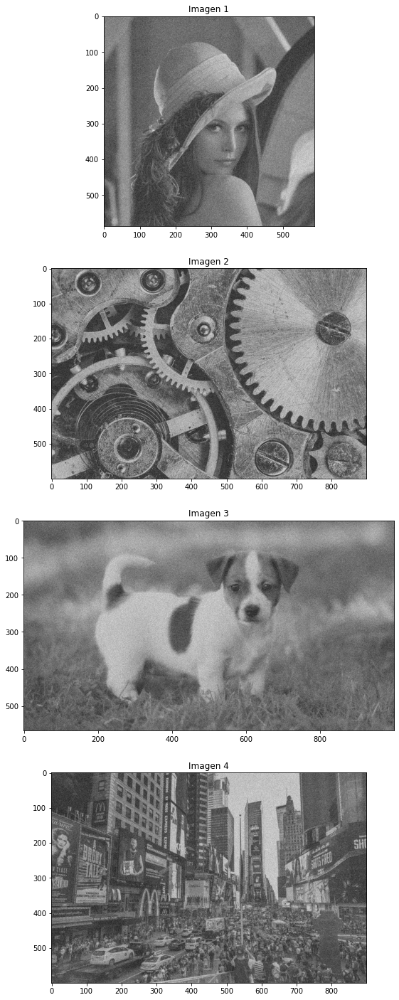

In [ ]:
imagen_gris1 = rgb2gray(imagen1)
imagen_gauss1 = noisy(imagen_gris1)

imagen_gris2 = rgb2gray(imagen2)
imagen_gauss2 = noisy(imagen_gris2)

imagen_gris3 = rgb2gray(imagen3)
imagen_gauss3 = noisy(imagen_gris3)

imagen_gris4 = rgb2gray(imagen4)
imagen_gauss4 = noisy(imagen_gris4)

##########################################################################################

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharex=False, sharey=False,figsize=(25, 25))

ax1.imshow(imagen_gauss1,cmap='gray')
ax1.set_title('Imagen 1')

ax2.imshow(imagen_gauss2,cmap='gray')
ax2.set_title('Imagen 2')

ax3.imshow(imagen_gauss3,cmap='gray')
ax3.set_title('Imagen 3')

ax4.imshow(imagen_gauss4,cmap='gray')
ax4.set_title('Imagen 4')

### Filtrado gaussiano a imagen con ruido gaussiano

Text(0.5, 1.0, 'Filtrado gaussiano alto')

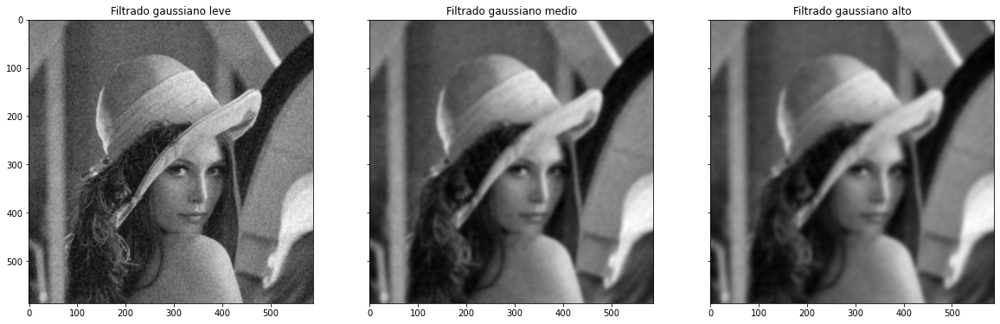

In [ ]:
imagen_gss1 = filters.gaussian(imagen_gauss1, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss2 = filters.gaussian(imagen_gauss1, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss3 = filters.gaussian(imagen_gauss1, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_gss1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_gss2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_gss3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')


Text(0.5, 1.0, 'Filtrado gaussiano alto')

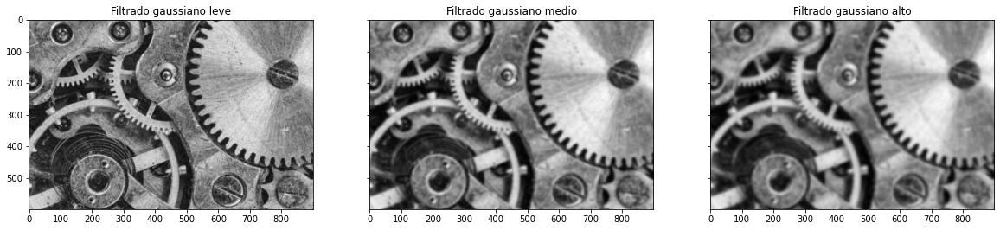

In [ ]:
imagen_gss1 = filters.gaussian(imagen_gauss2, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss2 = filters.gaussian(imagen_gauss2, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss3 = filters.gaussian(imagen_gauss2, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_gss1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_gss2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_gss3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')

Text(0.5, 1.0, 'Filtrado gaussiano alto')

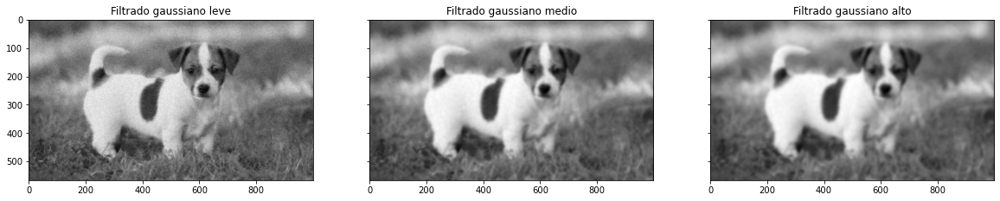

In [ ]:
imagen_gss1 = filters.gaussian(imagen_gauss3, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss2 = filters.gaussian(imagen_gauss3, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss3 = filters.gaussian(imagen_gauss3, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_gss1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_gss2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_gss3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')

Text(0.5, 1.0, 'Filtrado gaussiano alto')

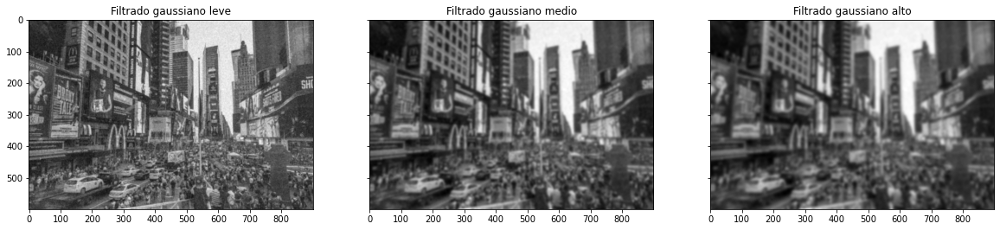

In [ ]:
imagen_gss1 = filters.gaussian(imagen_gauss4, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss2 = filters.gaussian(imagen_gauss4, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss3 = filters.gaussian(imagen_gauss4, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_gss1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_gss2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_gss3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')

## ----------------------------------------------------------------------------------------------------------------------------------

### Filtrado gaussiano a imagen con ruido de sal y pimienta

Text(0.5, 1.0, 'Filtrado gaussiano alto')

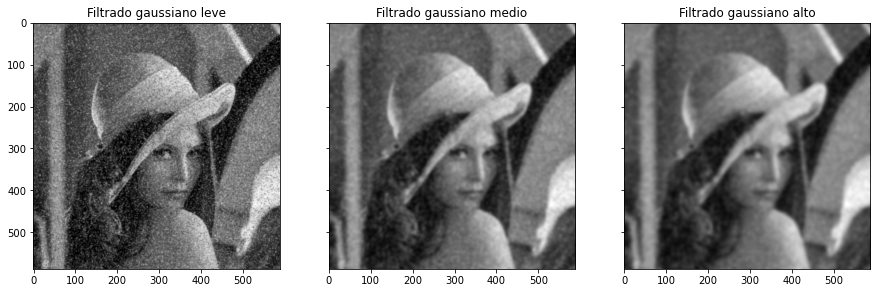

In [ ]:
imagen_sal1 = filters.gaussian(imagen_sp1, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal2 = filters.gaussian(imagen_sp1, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal3 = filters.gaussian(imagen_sp1, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(15, 5))

ax1.imshow(imagen_sal1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_sal2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_sal3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')

Text(0.5, 1.0, 'Filtrado gaussiano alto')

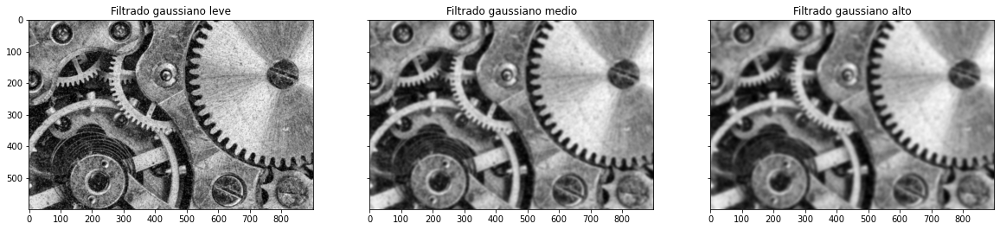

In [ ]:
imagen_sal1 = filters.gaussian(imagen_sp2, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal2 = filters.gaussian(imagen_sp2, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal3 = filters.gaussian(imagen_sp2, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_sal1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_sal2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_sal3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')

Text(0.5, 1.0, 'Filtrado gaussiano alto')

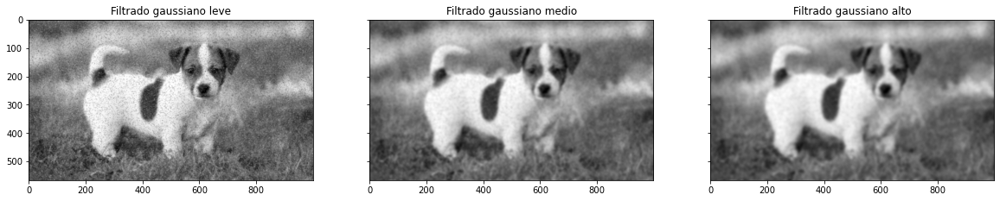

In [ ]:
imagen_sal1 = filters.gaussian(imagen_sp3, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal2 = filters.gaussian(imagen_sp3, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal3 = filters.gaussian(imagen_sp3, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_sal1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_sal2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_sal3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')

Text(0.5, 1.0, 'Filtrado gaussiano alto')

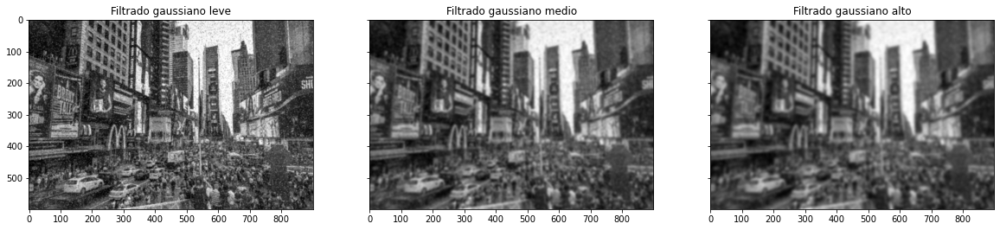

In [ ]:
imagen_sal1 = filters.gaussian(imagen_sp4, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal2 = filters.gaussian(imagen_sp4, sigma=3, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_sal3 = filters.gaussian(imagen_sp4, sigma=4, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_sal1,cmap='gray')
ax1.set_title('Filtrado gaussiano leve')

ax2.imshow(imagen_sal2,cmap='gray')
ax2.set_title('Filtrado gaussiano medio')

ax3.imshow(imagen_sal3,cmap='gray')
ax3.set_title('Filtrado gaussiano alto')

# /////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////

### Filtrado de mediana a imagen con ruido de sal y pimienta

Text(0.5, 1.0, 'Filtrado de mediana alto')

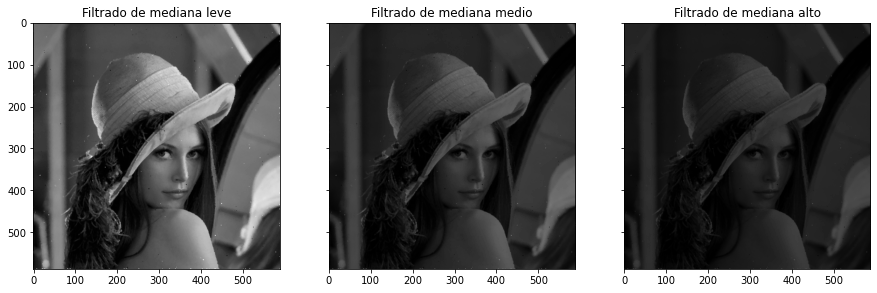

In [ ]:
imagen_mediana1 = filters.median(imagen_sp1, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_sp1, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_sp1, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(15, 5))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

Text(0.5, 1.0, 'Filtrado de mediana alto')

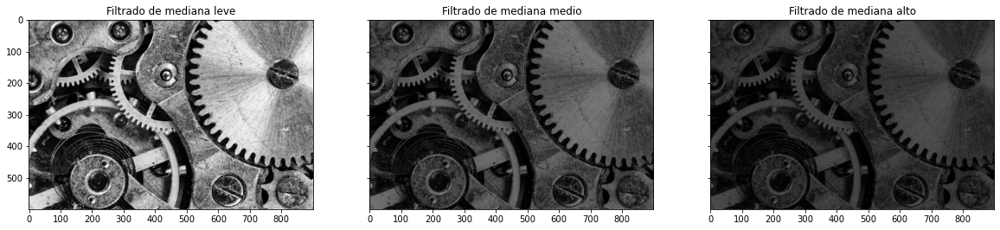

In [ ]:
imagen_mediana1 = filters.median(imagen_sp2, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_sp2, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_sp2, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

Text(0.5, 1.0, 'Filtrado de mediana alto')

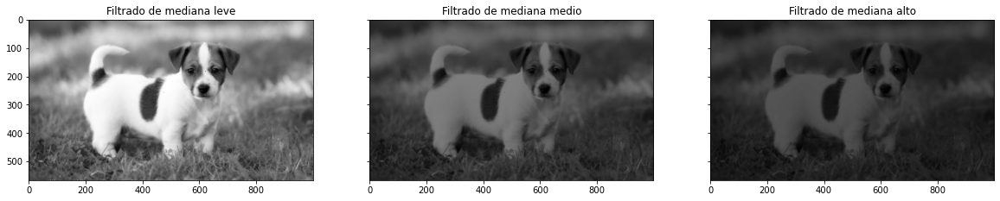

In [ ]:
imagen_mediana1 = filters.median(imagen_sp3, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_sp3, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_sp3, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

Text(0.5, 1.0, 'Filtrado de mediana alto')

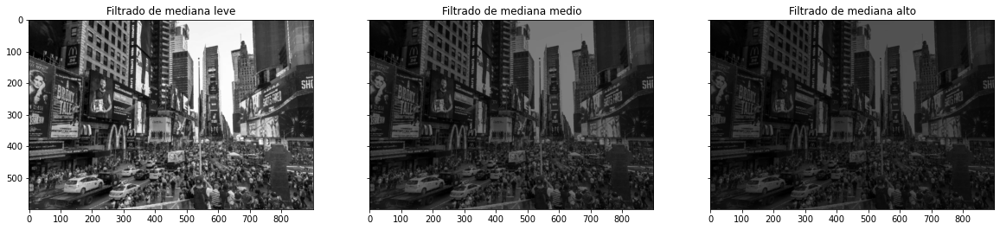

In [ ]:
imagen_mediana1 = filters.median(imagen_sp4, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_sp4, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_sp4, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

### Filtrado de mediana a imagen con ruido gaussiano

Text(0.5, 1.0, 'Filtrado de mediana alto')

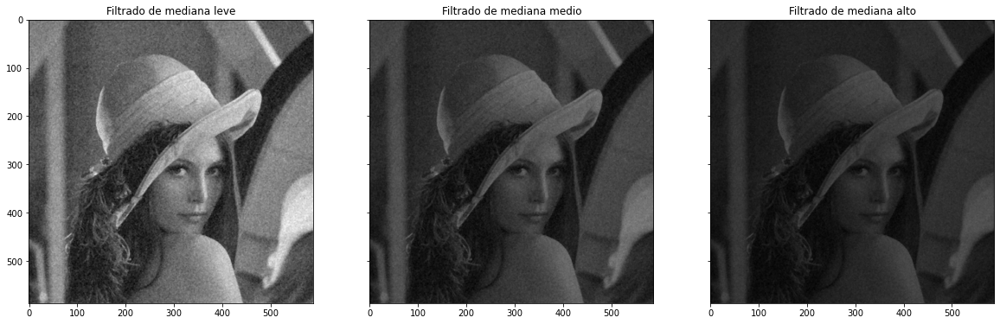

In [ ]:
imagen_mediana1 = filters.median(imagen_gauss1, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_gauss1, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_gauss1, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

Text(0.5, 1.0, 'Filtrado de mediana alto')

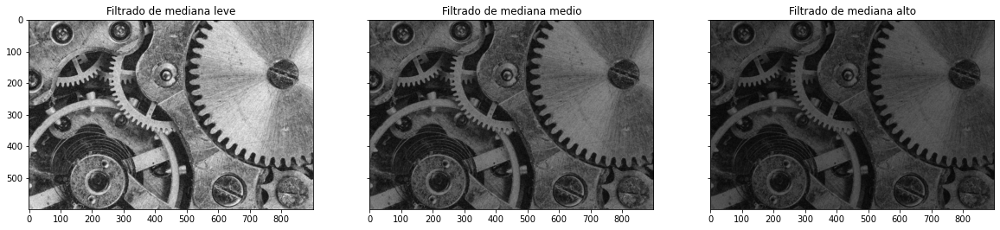

In [ ]:
imagen_mediana1 = filters.median(imagen_gauss2, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_gauss2, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_gauss2, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

Text(0.5, 1.0, 'Filtrado de mediana alto')

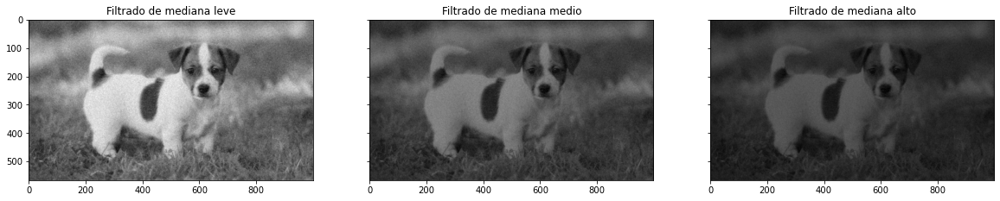

In [ ]:
imagen_mediana1 = filters.median(imagen_gauss3, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_gauss3, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_gauss3, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

Text(0.5, 1.0, 'Filtrado de mediana alto')

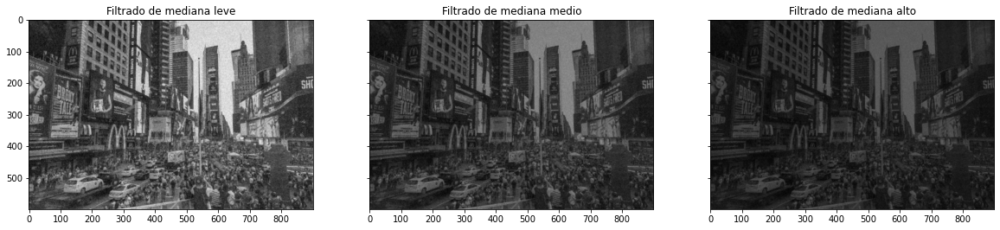

In [ ]:
imagen_mediana1 = filters.median(imagen_gauss4, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_mediana2 = filters.median(imagen_gauss4, selem=None, out=None, mode='constant', cval=2, behavior='ndimage')
imagen_mediana3 = filters.median(imagen_gauss4, selem=None, out=None, mode='constant', cval=3, behavior='ndimage')


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20, 20))

ax1.imshow(imagen_mediana1,cmap='gray')
ax1.set_title('Filtrado de mediana leve')

ax2.imshow(imagen_mediana2,cmap='gray')
ax2.set_title('Filtrado de mediana medio')

ax3.imshow(imagen_mediana3,cmap='gray')
ax3.set_title('Filtrado de mediana alto')

# /////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////

### Filtrado de media a imagen con ruido de sal y pimienta


C:\Users\Usuario\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


Text(0.5, 1.0, 'Filtrado de media alto')

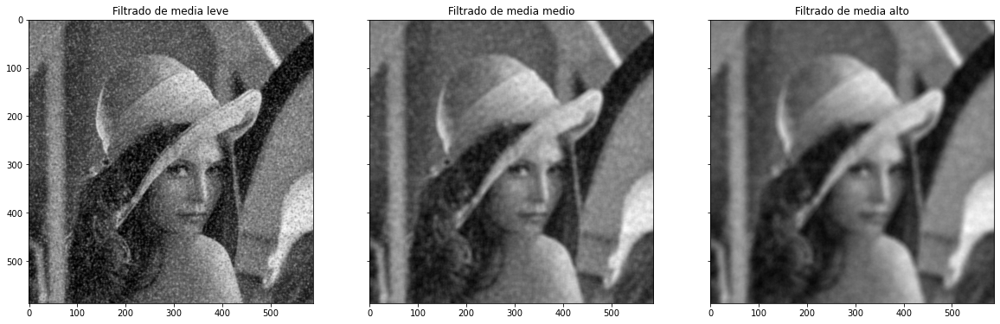

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_sp1, selem = disk(2))
imagen_media2 = rank.mean(imagen_sp1, selem = disk(5))
imagen_media3 = rank.mean(imagen_sp1, selem = disk(8))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

Text(0.5, 1.0, 'Filtrado de media alto')

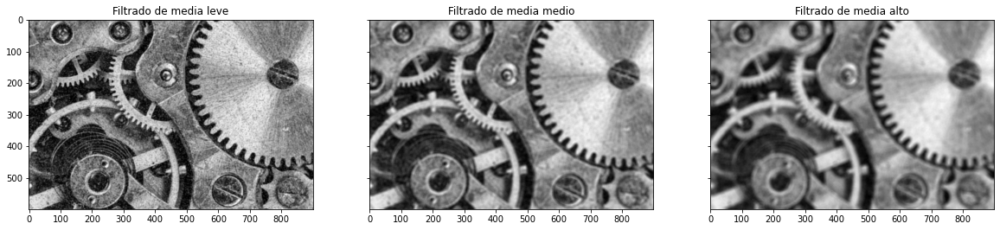

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_sp2, selem = disk(2))
imagen_media2 = rank.mean(imagen_sp2, selem = disk(5))
imagen_media3 = rank.mean(imagen_sp2, selem = disk(8))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

Text(0.5, 1.0, 'Filtrado de media alto')

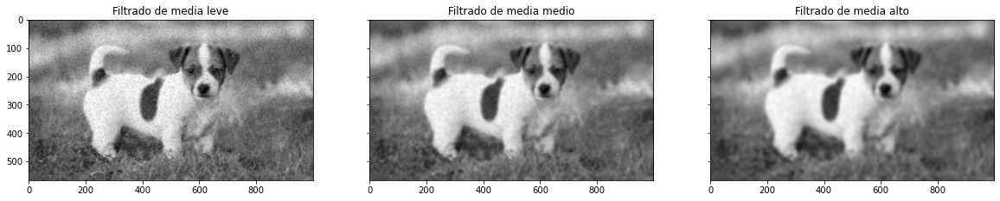

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_sp3, selem = disk(2))
imagen_media2 = rank.mean(imagen_sp3, selem = disk(5))
imagen_media3 = rank.mean(imagen_sp3, selem = disk(8))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

Text(0.5, 1.0, 'Filtrado de media alto')

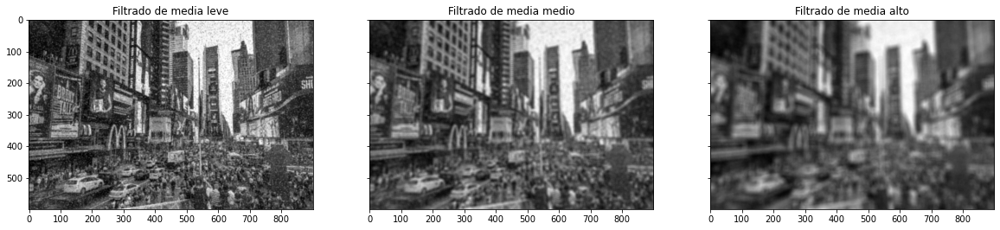

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_sp4, selem = disk(2))
imagen_media2 = rank.mean(imagen_sp4, selem = disk(5))
imagen_media3 = rank.mean(imagen_sp4, selem = disk(10))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(20,20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

### Filtrado de media a imagen con ruido gaussiano


Text(0.5, 1.0, 'Filtrado de media alto')

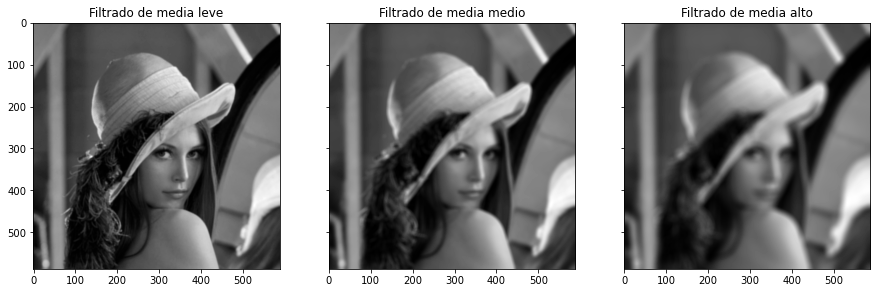

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_gris1, selem = disk(2))
imagen_media2 = rank.mean(imagen_gris1, selem = disk(5))
imagen_media3 = rank.mean(imagen_gris1, selem = disk(10))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(15, 20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

Text(0.5, 1.0, 'Filtrado de media alto')

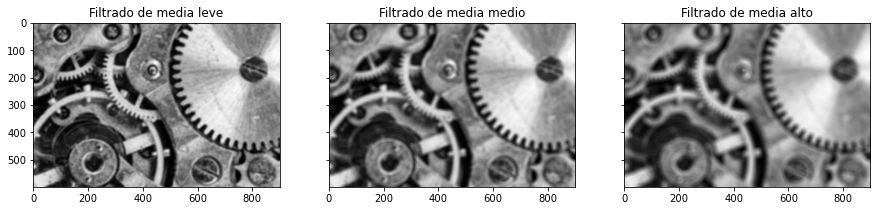

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_gris2, selem = disk(5))
imagen_media2 = rank.mean(imagen_gris2, selem = disk(8))
imagen_media3 = rank.mean(imagen_gris2, selem = disk(12))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(15, 20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

Text(0.5, 1.0, 'Filtrado de media alto')

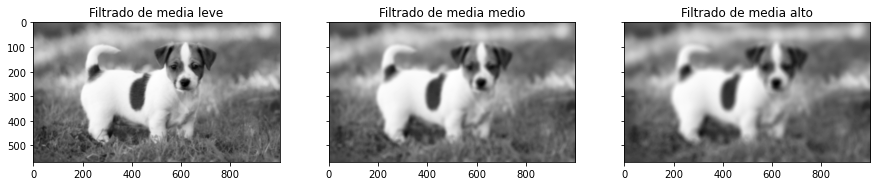

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_gris3, selem = disk(3))
imagen_media2 = rank.mean(imagen_gris3, selem = disk(8))
imagen_media3 = rank.mean(imagen_gris3, selem = disk(12))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(15, 20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

Text(0.5, 1.0, 'Filtrado de media alto')

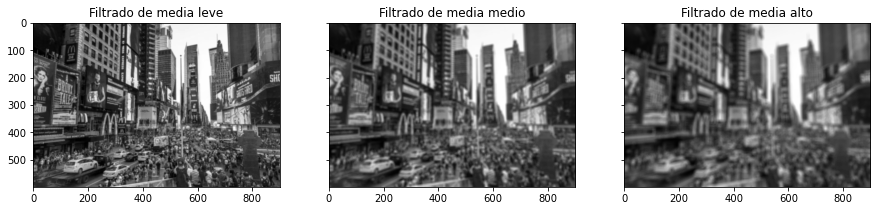

In [ ]:
selem = disk(15)

imagen_media1 = rank.mean(imagen_gris4, selem = disk(2))
imagen_media2 = rank.mean(imagen_gris4, selem = disk(5))
imagen_media3 = rank.mean(imagen_gris4, selem = disk(8))


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True,figsize=(15, 20))

ax1.imshow(imagen_media1,cmap='gray')
ax1.set_title('Filtrado de media leve')

ax2.imshow(imagen_media2,cmap='gray')
ax2.set_title('Filtrado de media medio')

ax3.imshow(imagen_media3,cmap='gray')
ax3.set_title('Filtrado de media alto')

# /////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////

#### Vamos a comparar una misma imagen filtrada con diferentes técnicas para ver cuál es la mejor a usar en cada situación

Text(0.5, 1.0, 'Filtrado media / Gaussiano')

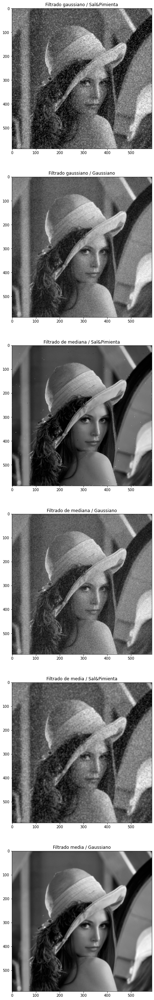

In [ ]:
imagen_sal1 = filters.gaussian(imagen_sp1, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_gss1 = filters.gaussian(imagen_gauss1, sigma=1, output=None, mode='nearest', cval=0, multichannel=None, preserve_range=False, truncate=4.0)
imagen_mediana1 = filters.median(imagen_sp1, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_median1 = filters.median(imagen_gauss1, selem=None, out=None, mode='constant', cval=1, behavior='ndimage')
imagen_media1 = rank.mean(imagen_sp1, selem = disk(3))
imagen_avg1 = rank.mean(imagen_gris1, selem = disk(2))

fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 1, sharex=False, sharey=False,figsize=(50, 50))

ax1.imshow(imagen_sal1,cmap='gray')
ax1.set_title('Filtrado gaussiano / Sal&Pimienta')

ax2.imshow(imagen_gss1,cmap='gray')
ax2.set_title('Filtrado gaussiano / Gaussiano')

ax3.imshow(imagen_mediana1,cmap='gray')
ax3.set_title('Filtrado de mediana / Sal&Pimienta')

ax4.imshow(imagen_median1,cmap='gray')
ax4.set_title('Filtrado de mediana / Gaussiano')

ax5.imshow(imagen_media1,cmap='gray')
ax5.set_title('Filtrado de media / Sal&Pimienta')

ax6.imshow(imagen_avg1,cmap='gray')
ax6.set_title('Filtrado media / Gaussiano')

1 - Filtrado gaussiano / Sal&Pimienta ·
No funciona correctamente con el ruido de S&P

2 - Filtrado gaussiano / Gaussiano ·
Es mejor alternativa a la hora de filtrar ruido gaussiano

3 - Filtrado de mediana / Sal&Pimienta ·
Filtra muy bien el ruido de S&P, aunque deja algunas particulas

4 - Filtrado de mediana / Gaussiano ·
Nos brinda resultados parecidos al filtrado gaussiano, aceptables pero lejos de ser perfectos

5 - Filtrado de media / Sal&Pimienta ·
Resultados muy malos, hace una media de los píxeles, y como hay valores tan dispares, obtenemos una imagen con mucho ruido

6 - Filtrado de media / Gaussiano ·
El mejor resultado de todos, la imagen ha quedado casi perfecta

#### ##################################################################################################################

#                                 --- DETECCIÓN DE BORDES ---

Text(0.5, 1.0, 'Imagen 4')

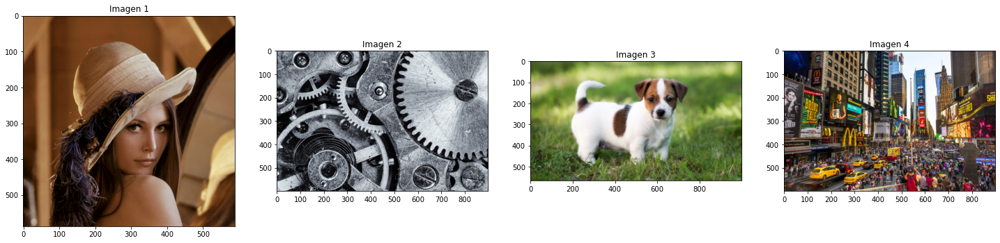

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex=False, sharey=False,figsize=(25, 10))

ax1.imshow(imagen1,cmap='gray')
ax1.set_title('Imagen 1')

ax2.imshow(imagen2,cmap='gray')
ax2.set_title('Imagen 2')

ax3.imshow(imagen3,cmap='gray')
ax3.set_title('Imagen 3')

ax4.imshow(imagen4,cmap='gray')
ax4.set_title('Imagen 4')

Text(0.5, 1.0, 'Detección de bordes Canny')

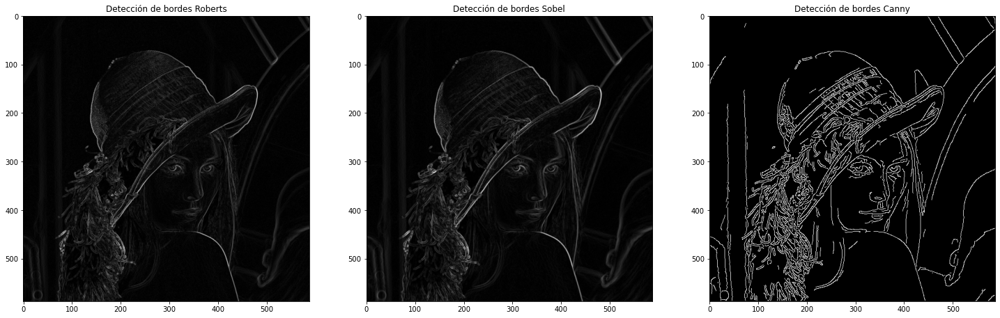

In [ ]:
imagen_gris = rgb2gray(imagen1)

bordes_roberts = filters.roberts(imagen_gris)
bordes_sobel = filters.sobel(imagen_gris)
bordes_canny = feature.canny(imagen_gris)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=False, sharey=False,figsize=(25, 10))

ax1.imshow(bordes_roberts,cmap='gray')
ax1.set_title('Detección de bordes Roberts')

ax2.imshow(bordes_sobel,cmap='gray')
ax2.set_title('Detección de bordes Sobel')

ax3.imshow(bordes_canny,cmap='gray')
ax3.set_title('Detección de bordes Canny')

Text(0.5, 1.0, 'Detección de bordes Canny')

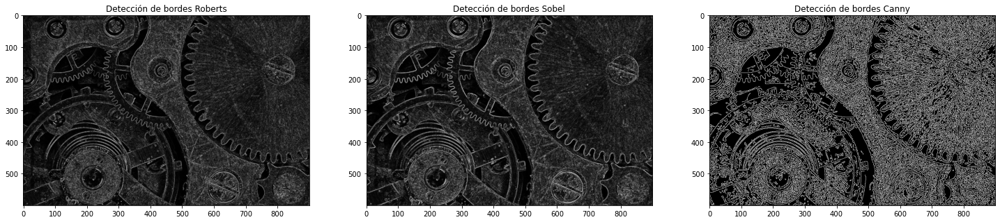

In [ ]:
imagen_gris = rgb2gray(imagen2)

bordes_roberts = filters.roberts(imagen_gris)
bordes_sobel = filters.sobel(imagen_gris)
bordes_canny = feature.canny(imagen_gris)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=False, sharey=False,figsize=(25, 10))

ax1.imshow(bordes_roberts,cmap='gray')
ax1.set_title('Detección de bordes Roberts')

ax2.imshow(bordes_sobel,cmap='gray')
ax2.set_title('Detección de bordes Sobel')

ax3.imshow(bordes_canny,cmap='gray')
ax3.set_title('Detección de bordes Canny')

Text(0.5, 1.0, 'Detección de bordes Canny')

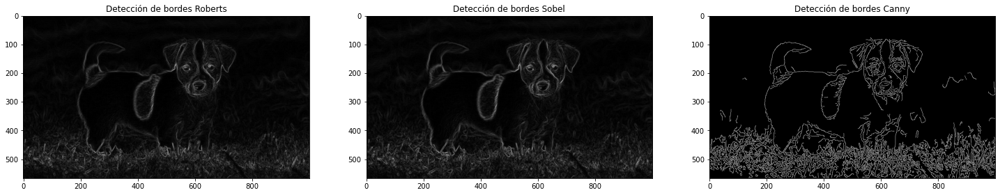

In [ ]:
imagen_gris = rgb2gray(imagen3)

bordes_roberts = filters.roberts(imagen_gris)
bordes_sobel = filters.sobel(imagen_gris)
bordes_canny = feature.canny(imagen_gris)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=False, sharey=False,figsize=(25, 10))

ax1.imshow(bordes_roberts,cmap='gray')
ax1.set_title('Detección de bordes Roberts')

ax2.imshow(bordes_sobel,cmap='gray')
ax2.set_title('Detección de bordes Sobel')

ax3.imshow(bordes_canny,cmap='gray')
ax3.set_title('Detección de bordes Canny')

Text(0.5, 1.0, 'Detección de bordes Canny')

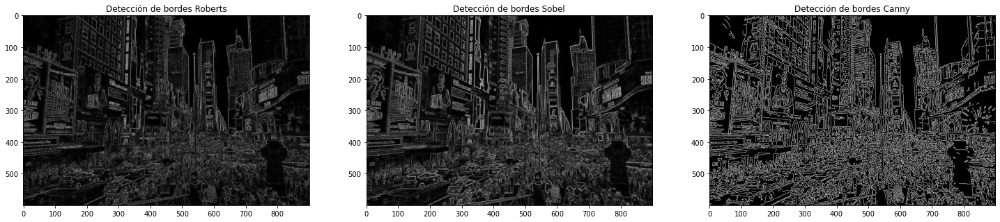

In [ ]:
imagen_gris = rgb2gray(imagen4)

bordes_roberts = filters.roberts(imagen_gris)
bordes_sobel = filters.sobel(imagen_gris)
bordes_canny = feature.canny(imagen_gris)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=False, sharey=False,figsize=(25, 10))

ax1.imshow(bordes_roberts,cmap='gray')
ax1.set_title('Detección de bordes Roberts')

ax2.imshow(bordes_sobel,cmap='gray')
ax2.set_title('Detección de bordes Sobel')

ax3.imshow(bordes_canny,cmap='gray')
ax3.set_title('Detección de bordes Canny')
